In [ ]:
import matplotlib.pyplot as plt

import plotly.express as px

import folium

from folium import plugins

from folium.plugins import HeatMap

import seaborn as sns

import pandas as pd
import networkx as nx
import numpy as np



In [5]:
read=pd.read_csv(r'/content/rideshare_kaggle.csv')

In [8]:
read.describe().T.style.background_gradient().to_excel(r"C:\Users\mahav\Music\uberdata.xlsx")

In [9]:
corrletion=read.corr()[['price']]

<ipython-input-9-0ab7c51075b8>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrletion=read.corr()[['price']]


In [49]:
more=corrletion[(corrletion['price']>0.05)| (corrletion['price']<-0.05)]


<Axes: >

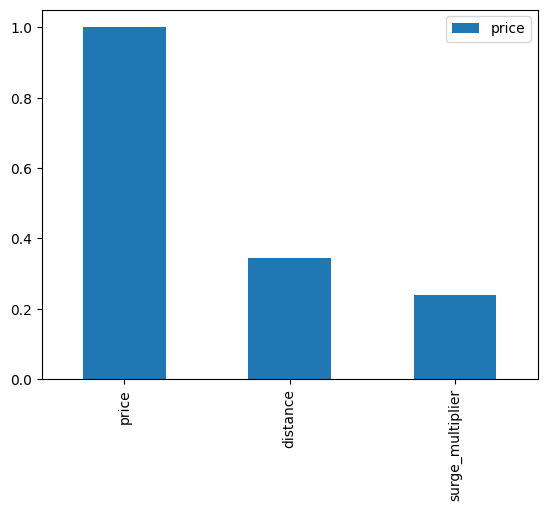

In [50]:
more.plot.bar()

<Axes: >

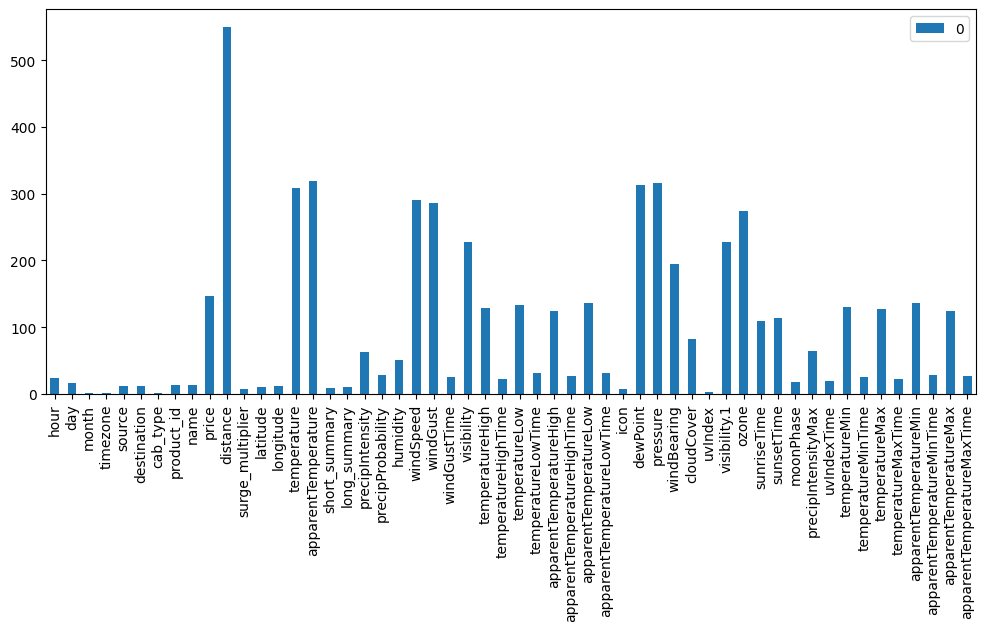

In [16]:
pd.DataFrame(read.drop(columns=['id','timestamp','datetime']).nunique()).plot.bar(figsize=(12,5),label=True)


In [18]:
basic_summary=read[['source','destination','id']]

In [19]:
colsx=list(basic_summary.groupby(['source','destination']).count().reset_index().pivot(values='id',columns='destination',index='source').reset_index().columns)

In [20]:
fig = px.bar(basic_summary.groupby(['source','destination']).count().reset_index().pivot(values='id',columns='destination',index='source').reset_index(), y=colsx, x="source", barmode='stack',title="Wide-Form Input")
fig.show(figsize=(12,5))

In [24]:
def plot_bar(groupby_column):
    x1 =read.groupby(groupby_column).size().reset_index(name="counts")
    fig1 = px.bar(data_frame=x1, x=groupby_column, y="counts", barmode="stack")
    print(x1)
    fig1.show(renderer='png')

NameError: ignored

In [26]:
!pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 2.1 MB/s eta 0:00:00


In [27]:
import kaleido

<Axes: >

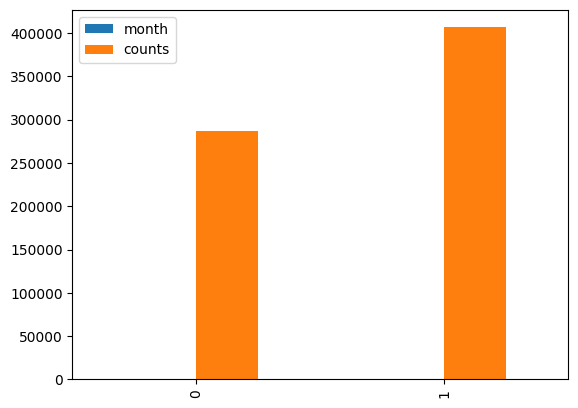

In [29]:
import kaleido
read.groupby('month').size().reset_index(name="counts").plot.bar()

In [31]:
import statistics
from pandas.io.parsers.readers import read_csv
longs = read.longitude.to_list()
lats = read.latitude.to_list()
meanLong = statistics.mean(longs)
meanLat = statistics.mean(lats)
mapObj = folium.Map(location=[meanLat, meanLong], tiles="openstreetmap", zoom_start = 17.5)
read.dropna(inplace = True)
heatmap = HeatMap( list(zip(lats, longs, read["price"])),
                   min_opacity=0.5,
                   max_val=read["price"].max(),
                   radius=40, blur=35)
heatmap.add_to(mapObj)
mapObj

<ipython-input-31-b9787826cbf6>:9: UserWarning:

The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.



<Axes: >

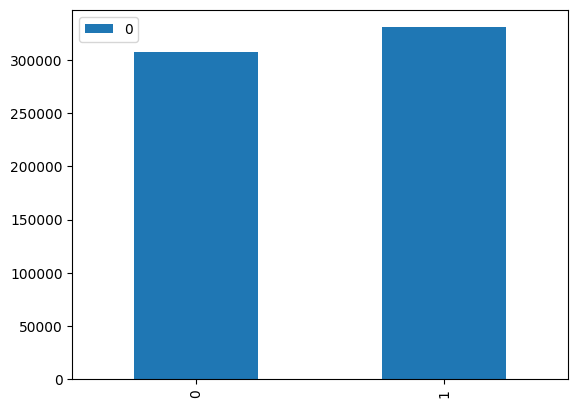

In [32]:
read.groupby('cab_type').size().reset_index().plot.bar()

In [33]:
read.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [43]:
more

,price
price,1.000000
distance,0.345061
surge_multiplier,0.240458


In [34]:
import pandas as pd

# Assuming 'data' is your DataFrame containing 'source' and 'destination' columns
unique_source_values = read['source'].unique()
unique_destination_values = read['destination'].unique()

source_counts = read['source'].value_counts()
destination_counts = read['destination'].value_counts()

# Print unique values and their counts for 'source'
print("Unique Source Values:", unique_source_values)
print("Source Value Counts:")
print(source_counts)

# Print unique values and their counts for 'destination'
print("\nUnique Destination Values:", unique_destination_values)
print("Destination Value Counts:")
print(destination_counts)


Unique Source Values: ['Haymarket Square' 'Back Bay' 'North End' 'North Station' 'Beacon Hill'
 'Boston University' 'Fenway' 'South Station' 'Theatre District'
 'West End' 'Financial District' 'Northeastern University']
Source Value Counts:
Financial District         54197
Back Bay                   53201
Theatre District           53201
Boston University          53172
North End                  53171
Fenway                     53166
Northeastern University    53164
South Station              53160
Haymarket Square           53147
West End                   52980
Beacon Hill                52841
North Station              52576
Name: source, dtype: int64

Unique Destination Values: ['North Station' 'Northeastern University' 'West End' 'Haymarket Square'
 'South Station' 'Fenway' 'Theatre District' 'Beacon Hill' 'Back Bay'
 'North End' 'Financial District' 'Boston University']
Destination Value Counts:
Financial District         54192
Back Bay                   53190
Theatre District  

<Axes: xlabel='source,destination'>

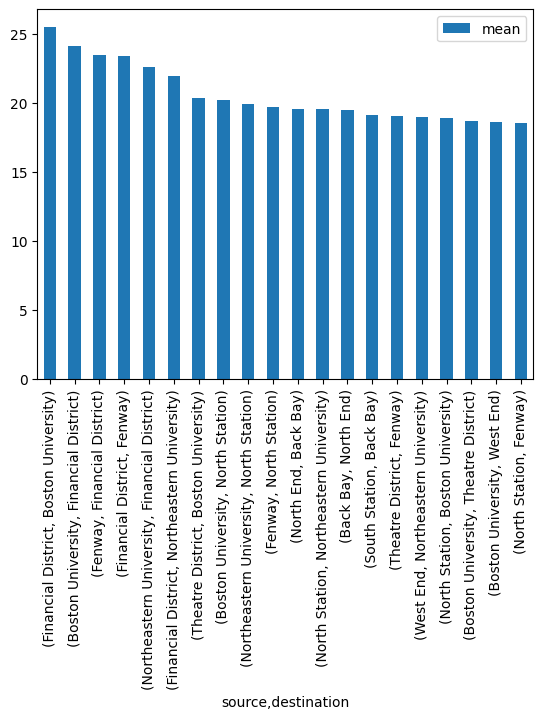

In [35]:
pd.set_option('display.max_rows', 72)
read.groupby(by=["source","destination"]).price.agg(["mean"]).sort_values("mean", ascending=False)[:20].plot.bar()

In [36]:
df =read.groupby(by=["day","cab_type"]).size().reset_index(name="counts")
px.bar(data_frame=df, x="day", y="counts", color="cab_type", barmode="group")

In [37]:
import pandas as pd
import plotly.express as px

# Assuming 'df' is your DataFrame
# Group the data by "day" and "cab_type" and calculate counts
grouped_df = df.groupby(["day", "cab_type"]).size().reset_index(name="counts")

# Create a grouped bar chart using Plotly Express
fig = px.bar(data_frame=grouped_df, x="day", y="counts", color="cab_type", barmode="group")

# Customize the x-axis labels
custom_labels = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
fig.update_xaxes(type="category", categoryorder="array", categoryarray=custom_labels)

# Display the chart
fig.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



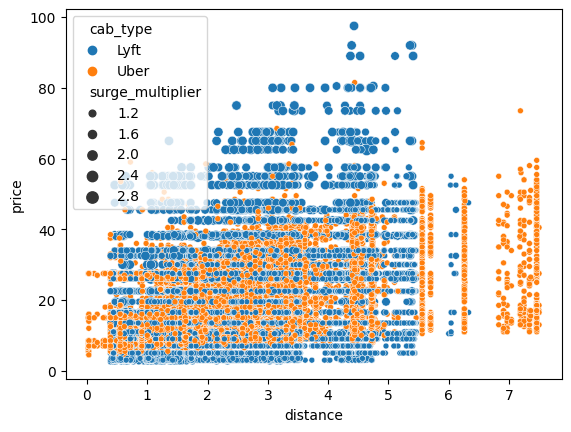

In [39]:
df = read[(read["hour"]>=22) | (read["hour"]<=4)]
sns.scatterplot(data = df, x = "distance",
                y = "price", hue = "cab_type", size = "surge_multiplier")
plt.show()

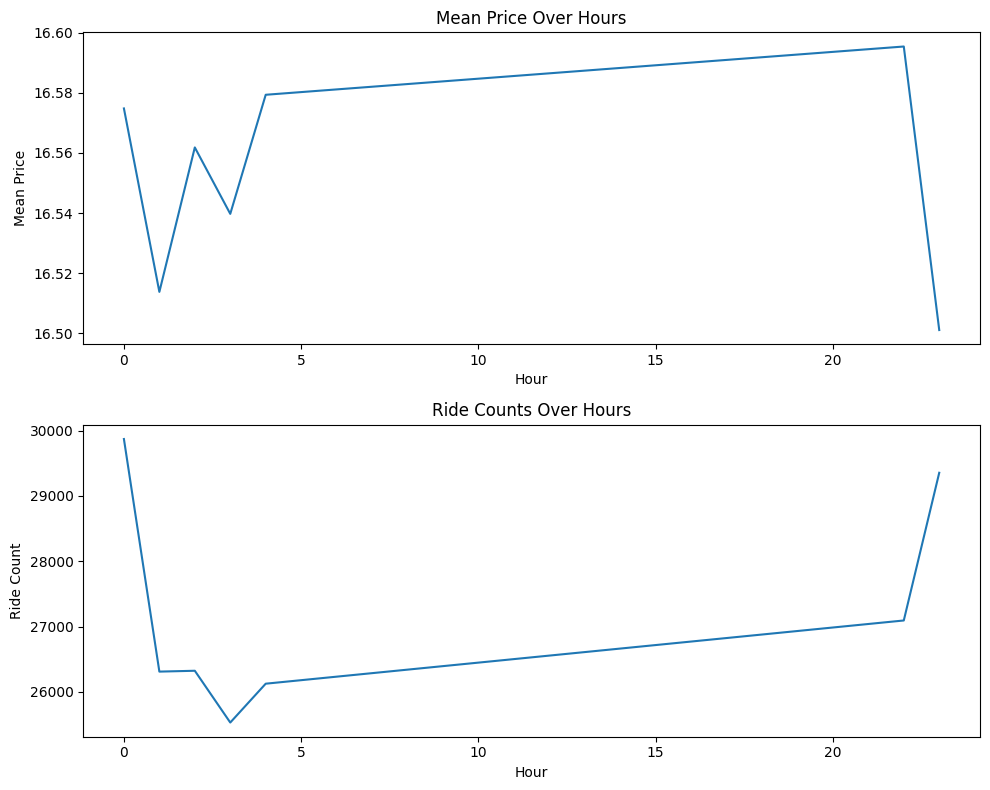

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame
# Filter data for late-night and early-morning hours
df = read[(read["hour"] >= 22) | (read["hour"] <= 4)]

# Group the filtered data by hour and calculate mean price and ride counts
hourly_stats = df.groupby("hour").agg({"price": "mean", "id": "count"}).reset_index()
hourly_stats.rename(columns={"price": "mean_price", "id": "ride_count"}, inplace=True)

# Create subplots for price and ride counts
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Plot mean price over hours
sns.lineplot(data=hourly_stats, x="hour", y="mean_price", ax=ax1)
ax1.set_title("Mean Price Over Hours")
ax1.set_xlabel("Hour")
ax1.set_ylabel("Mean Price")

# Plot ride counts over hours
sns.lineplot(data=hourly_stats, x="hour", y="ride_count", ax=ax2)
ax2.set_title("Ride Counts Over Hours")
ax2.set_xlabel("Hour")
ax2.set_ylabel("Ride Count")

plt.tight_layout()
plt.show()


In [45]:
data_x=read[list(more.index)].drop(columns=['latitude','longitude'])


KeyError: ignored

In [46]:
import pandas as pd

# Assuming 'df' is your DataFrame
column_list = read.columns.tolist()

# Print the list of columns
print(column_list)


['id', 'timestamp', 'hour', 'day', 'month', 'datetime', 'timezone', 'source', 'destination', 'cab_type', 'product_id', 'name', 'price', 'distance', 'surge_multiplier', 'latitude', 'longitude', 'temperature', 'apparentTemperature', 'short_summary', 'long_summary', 'precipIntensity', 'precipProbability', 'humidity', 'windSpeed', 'windGust', 'windGustTime', 'visibility', 'temperatureHigh', 'temperatureHighTime', 'temperatureLow', 'temperatureLowTime', 'apparentTemperatureHigh', 'apparentTemperatureHighTime', 'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon', 'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex', 'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase', 'precipIntensityMax', 'uvIndexTime', 'temperatureMin', 'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime', 'apparentTemperatureMin', 'apparentTemperatureMinTime', 'apparentTemperatureMax', 'apparentTemperatureMaxTime']


In [47]:
data_x=read[list(more.index)].drop(columns=['latitude','longitude'])


KeyError: ignored

In [48]:
import pandas as pd

# Assuming 'df' is your DataFrame
pd.set_option('display.max_columns', None)  # Set to None to display all columns
column_list = read.columns.tolist()

# Print the list of columns
print(column_list)


['id', 'timestamp', 'hour', 'day', 'month', 'datetime', 'timezone', 'source', 'destination', 'cab_type', 'product_id', 'name', 'price', 'distance', 'surge_multiplier', 'latitude', 'longitude', 'temperature', 'apparentTemperature', 'short_summary', 'long_summary', 'precipIntensity', 'precipProbability', 'humidity', 'windSpeed', 'windGust', 'windGustTime', 'visibility', 'temperatureHigh', 'temperatureHighTime', 'temperatureLow', 'temperatureLowTime', 'apparentTemperatureHigh', 'apparentTemperatureHighTime', 'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon', 'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex', 'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase', 'precipIntensityMax', 'uvIndexTime', 'temperatureMin', 'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime', 'apparentTemperatureMin', 'apparentTemperatureMinTime', 'apparentTemperatureMax', 'apparentTemperatureMaxTime']


In [52]:
data_x=read[list(more.index)].drop(columns=['latitude','longitude'])

KeyError: ignored

<ipython-input-53-42a8205d4626>:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



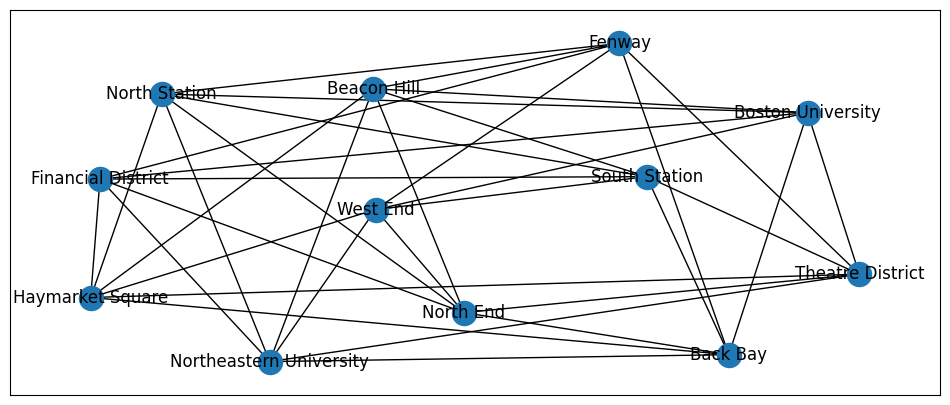

In [53]:
summary=read.groupby(['source','destination']).count()[['id']].reset_index()
summary['id']=summary['id']/5000
summary=pd.DataFrame(read.groupby(['source','destination']).sum()['price']/read.groupby(['source','destination']).count()['id'])
summary=summary.rename(columns={0:"Metric"})
summary=summary.reset_index()

G = nx.from_pandas_edgelist(df=read[['source','destination']], source='source', target='destination')
G.add_nodes_from(nodes_for_adding=summary.source.tolist())
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

fig, ax = plt.subplots(figsize=(12,5))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos)
nx.draw_networkx_edges(G, pos, ax=ax)
_ = nx.draw_networkx_labels(G, pos, labels, ax=ax)
